## Plotting notebook for the loop caller plots in the RCMC ML Paper

In [28]:
# import statements
import numpy as np
import pandas as pd
from matplotlib import colors
import matplotlib.pyplot as plt
import re
import cooler
import os
import seaborn as sns
from cooltools.lib import plotting, numutils

import matplotlib.ticker
from matplotlib.ticker import EngFormatter
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
bp_formatter = EngFormatter('b')


## Functions

In [29]:
# both peakachu and mustache are in bedpe style coordinates; this converts them to bed style for ease

def process_mustache(mustache_df, cutoff=None):
    binsize = mustache_df['BIN1_END'] - mustache_df['BIN1_END']
    binsize = binsize.iloc[0]

    mustache_df.drop(['BIN1_END', 'BIN2_END', 'BIN2_CHROMOSOME', 'DETECTION_SCALE'], axis=1, inplace=True)
    mustache_df.rename({'BIN1_CHR': 'chr1', 'BIN1_START': 'start1', 'BIN2_START': 'end1', 'FDR': 'prob'}, axis=1,
                               inplace=True)
    mustache_df['anchor1'] = mustache_df['start1'] + binsize
    mustache_df['anchor2'] = mustache_df['end1'] + binsize
    
    ind_to_keep = search_excl_base(mustache_df, bases_exclude, pad=0)
    mustache_df = mustache_df[ind_to_keep].reset_index(drop=True)
    
    if cutoff is not None:
        mustache_df = mustache_df[mustache_df['prob']<=cutoff]
    
    return mustache_df

def process_peakachu(peakachu_df, cutoff=None):
    peakachu_bed = pd.DataFrame()
    peakachu_bed['chr1'] = peakachu_df.iloc[:, 0]
    peakachu_bed['anchor1'] = np.mean(peakachu_df.loc[:,'start1':'end1'].to_numpy(), axis=1)
    peakachu_bed['anchor2'] = np.mean(peakachu_df.loc[:,'start2':'end2'].to_numpy(), axis=1)
    peakachu_bed['prob'] = peakachu_df['prob']
    
    if cutoff is not None:
        peakachu_bed = peakachu_bed[peakachu_bed['prob']>=cutoff]
    
    return peakachu_bed

In [30]:
def loops_to_matrix_bed(df, st, ed, binsize=1000):
    loop_coords = ((df[['anchor1', 'anchor2']].to_numpy()) - st) // binsize

    # initialize matrix based on the binsize and chrom coordinates
    matr_size = (ed - st) // binsize
    truth_matr = np.zeros([matr_size, matr_size])

    # fill the matrix with the loop coordinates
    # pad is in pixel coordinates for now (should prob translate to genomic BP) **
    for i in range(len(loop_coords)):
        truth_matr[int(loop_coords[i, 0]), int(loop_coords[i, 1])] = 1

    return truth_matr

def get_matr(clr, capture_string, oe=True):
    clr_mat = clr.matrix(balance=True).fetch(capture_string)
    clr_mat[np.isnan(clr_mat)] = 0
    if oe:
        clr_mat_balanced = numutils.observed_over_expected(clr_mat)[0]
        return clr_mat_balanced
    else:
        return clr_mat

def get_coords(locus_str):
    m = re.search(r'(chr\w+):(\d+)-(\d+)', locus_str)
    chrom = m.group(1)
    start_coord = int(m.group(2))
    end_coord = int(m.group(3))
    try:
        chrom = int(chrom)
    except:
        return chrom, start_coord, end_coord
    return chrom, start_coord, end_coord

In [31]:
def format_ticks(ax, x=True, y=True, rotate=False):
        if y:
            ax.yaxis.set_major_formatter(bp_formatter)
            ax.set_yticks([])
        if x:
            ax.xaxis.set_major_formatter(bp_formatter)
            ax.xaxis.tick_bottom()
        if rotate:
            ax.tick_params(axis='x',rotation=45)
            
            
def plot_loops_same_region(loop_df_list, matr, region_str, color_list, res, vrange=(0, 1), figsize=(10, 10), sd=None):
    fig, axs = plt.subplots(1, len(loop_df_list), figsize=figsize)
    ch, st, ed = get_coords(region_str)
    
    for i in range(len(loop_df_list)):
        loops = loop_df_list[i]
        loops = loops[(loops['anchor1']>st) & (loops['anchor2']<ed) & (loops['chr1']==ch)]
        im=axs[i].matshow(matr, norm = colors.LogNorm(vmin=vrange[0], vmax=vrange[1]), cmap='fall')
        axs[i].scatter((loops['anchor1'] - st) // res, (loops['anchor2'] - st) // res, linewidth=1,
                       s=20, c=color_list[i], marker='o', edgecolors='k', alpha=1)
        axs[i].xaxis.set_major_locator(plt.MaxNLocator(2))
        labels = [str(np.round((int(re.sub(u"\u2212", "-", item.get_text()))*res + st)/1e6, 1)) for item in axs[i].get_xticklabels()]
        labels = [f"{l} Mb" for l in labels]
        axs[i].set_xticklabels(labels, ha='center')
        axs[i].tick_params(axis='both', which='major', labelsize=16)
        #format_ticks(ax, rotate=False)
        axs[i].set_yticks([])
        axs[i].xaxis.tick_bottom()
    #plt.colorbar(im, ax=axs[len(loop_df_list)-1], fraction=0.046, pad=0.04)
    plt.tight_layout()
    
    if sd is not None:
        plt.savefig(sd, dpi=300)
    else:
        plt.show()
    return fig

def plot_loops_single(loop_df, matr, region_str, color, res, vrange=(0, 1), figsize=(10, 10), sd=None):
    fig, ax = plt.subplots(figsize=figsize)
    ch, st, ed = get_coords(region_str)
  
    loops = loop_df
    loops = loops[(loops['anchor1']>st) & (loops['anchor2']<ed) & (loops['chr1']==ch)]
    im=ax.matshow(matr, norm = colors.LogNorm(vmin=vrange[0], vmax=vrange[1]), cmap='fall')
    ax.scatter((loops['anchor1'] - st) // res, (loops['anchor2'] - st) // res, linewidth=1,
                    s=20, marker='o', edgecolors='k', alpha=1)
        
    labels = [str(np.round((int(re.sub(u"\u2212", "-", item.get_text()))*res + st)/1e6, 1)) for item in ax.get_xticklabels()]
    labels = [f"{l} Mb" for l in labels]
    ax.set_xticklabels(labels)
    ax.tick_params(axis='both', which='major', labelsize=figsize[0]//2)
    #format_ticks(ax, rotate=False)
    ax.set_yticks([])
    ax.xaxis.tick_bottom()
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    
    if sd is not None:
        plt.savefig(sd, dpi=300)
    else:
        plt.show()
    return fig

def plot_loops_symm(loop_df_list, matr, region_str, color_list, res, vrange=(0, 1), figsize=(10, 10), sd=None):
    fig, axs = plt.subplots(1, len(loop_df_list)-1, figsize=figsize)
    ch, st, ed = get_coords(region_str)
    
    # assume the 1st is the comparing loop set
    
    for i in range(len(loop_df_list[1:])):
        gt = loop_df_list[0]
        gt = gt[(gt['anchor1']>st) & (gt['anchor2']<ed) & (gt['chr1']==ch)]
        loops = loop_df_list[i+1]
        loops = loops[(loops['anchor1']>st) & (loops['anchor2']<ed) & (loops['chr1']==ch)]
        im=axs[i].matshow(matr, norm = colors.LogNorm(vmin=vrange[0], vmax=vrange[1]), cmap='fall')
        axs[i].scatter((gt['anchor1'] - st) // res, (gt['anchor2'] - st) // res, linewidth=1,
                       s=20, c=color_list[0], marker='o', edgecolors='k', alpha=1)
        axs[i].scatter((loops['anchor2'] - st) // res, (loops['anchor1'] - st) // res, linewidth=1,
                       s=20, c=color_list[i+1], marker='o', edgecolors='k', alpha=1)
        
        labels = [str(np.round((int(re.sub(u"\u2212", "-", item.get_text()))*res + st)/1e6, 1)) for item in axs[i].get_xticklabels()]
        labels = [f"{l} Mb" for l in labels]
        axs[i].set_xticklabels(labels)
        axs[i].tick_params(axis='both', which='major', labelsize=12)
        #format_ticks(ax, rotate=False)
        axs[i].set_yticks([])
        axs[i].xaxis.tick_bottom()
    #plt.colorbar(im, ax=axs[len(loop_df_list)-1], fraction=0.046, pad=0.04)
    plt.tight_layout()
    
    if sd is not None:
        plt.savefig(sd, dpi=300)
    else:
        plt.show()
    return fig

In [32]:
def search_excl_base(loops, bases, pad=50, prob_cutoff=0.9999):
    #print(loops)
    #print(bases)
    mask = pd.Series([True] * len(loops))

    # Vectorized comparison: iterate through df2 and mark df1 rows that fall in any df2 range
    for i in range(len(bases)):
        mask &= ~(((loops['anchor1'].between(bases.iloc[i]['anchor1']-pad, bases.iloc[i]['anchor2']+pad)) |
                  (loops['anchor2'].between(bases.iloc[i]['anchor1']-pad, bases.iloc[i]['anchor2']+pad))) &
                  (loops['prob'] < prob_cutoff))
    return mask

### Setup

In [33]:
# define all regions
ch_coord_all = {
        'region1': 'chr6:25111000-28622000', # in training set
        'region2': 'chr19:36027000-39757000', # in training set
        'region3': 'chr5:157000000-160150000', # in held out set
        'region4': 'chr1:207626000-210339000', # in held out set
        'region5': 'chr4:61369000-64435000', # in training set
        'region6': 'chr8:124988000-129796000',
        'region7': 'chr6:29678000-32257000',
        'region8': 'chrX:47081000-49443000',
        'region9': 'chr1:23728000-240532000', 
        'region10': 'chr7:10480000-13507000',
        'region11': 'chr8:62918000-66567000',
        'region12': 'chr4:181289000-184015000',
        'region13': 'chr3:118624000-121534000',
        'region14': 'chr9:106603000-109910000'
    }

In [34]:
base_dir = '/mnt/md0/varshini/RCMC_LoopCaller/'
res_range = (1000, 2000)
celltypes = ['GM12878', 'HCT116', 'K562', 'H1']

In [35]:
# load coolers
clrs = {}
for ct in celltypes:
    for res in res_range:
        clrs[ct] = list(map(lambda res: cooler.Cooler(os.path.join(base_dir, f'data/{ct}_merged_realigned.50.mcool::resolutions/{str(res)}')), res_range))

In [36]:
bases_exclude = pd.read_csv(os.path.join(base_dir, 'final_panel_bases_not_covered.bed'),  sep='\s+')
bases_exclude = pd.read_csv(os.path.join(base_dir, 'v1_v2_bases_not_covered.bed'),  sep='\s+')
bases_exclude.rename({'start1':'anchor1', 'end1':'anchor2'}, axis=1, inplace=True)
print(bases_exclude)

       chr1    anchor1    anchor2
0      chr1  207626721  207627121
1      chr1  207627601  207627761
2      chr1  207632481  207632881
3      chr1  207633761  207634241
4      chr1  207635201  207639201
...     ...        ...        ...
26839  chrX   49344151   49344231
26840  chrX   49344951   49345111
26841  chrX   49345991   49346311
26842  chrX   49346871   49347591
26843  chrX   49348311   49442070

[26844 rows x 3 columns]


In [37]:
# load loopcalls for all 3 callers 
idli_path = os.path.join(base_dir, 'loopcalls/All_LoopCalls/strict_0.995')
idli_heldout_path = os.path.join(base_dir, 'loopcalls/v2_testing/pre_hp_4_ftr_2024-11-13/merged-strict')
peakachu_path = os.path.join(base_dir, 'loopcalls/peakachu')
mustache_path = os.path.join(base_dir, 'loopcalls/mustache')

idli = {}
idli_heldout = {}
peakachu = {}
mustache = {}
mustache_pt02 = {}

for ct in celltypes:
    if ct=='gGM12878':
        idli_curr = pd.read_csv(f'{idli_path}/{ct}_heldout_added_calls.txt', sep='\t')
        idli_curr.rename({'start1':'anchor1', 'end1':'anchor2'}, inplace=True, axis=1)
        idli_curr['prob'] = 1
    else:
        idli_curr = pd.read_csv(f'{idli_path}/{ct}_loopcalls.txt', sep='\t', names=['chr1', 'anchor1', 'anchor2', 'prob']) 
    ind_to_keep = search_excl_base(idli_curr, bases_exclude, pad=0)
    idli_curr = idli_curr[ind_to_keep].reset_index(drop=True)
    idli[ct] = idli_curr
    
    idli_heldout_curr = pd.read_csv(f'{idli_heldout_path}/{ct}_region3,region5_loops_merged_gaussian.txt', sep='\t')
    idli_heldout_curr.rename({'loopLikelihood':'prob'}, inplace=True, axis=1)
    ind_to_keep = search_excl_base(idli_heldout_curr, bases_exclude, pad=0)
    idli_heldout_curr = idli_heldout_curr[ind_to_keep].reset_index(drop=True)
    idli_heldout[ct] = idli_heldout_curr[idli_heldout_curr['prob']>0.99]
    print(idli_heldout[ct])
    
    mustache_curr = pd.read_csv(f'{mustache_path}/{ct}_1kb_chr5_s01.6_st0.88.tsv', sep='\t') 
    mustache_curr = process_mustache(mustache_curr, cutoff=0.05)
    mustache[ct] = mustache_curr
    
    mustache_curr_pt02 = pd.read_csv(f'{mustache_path}/{ct}_1kb_chr5_s01.6_st0.88_pt0.2.tsv', sep='\t') 
    mustache_curr_pt02 = process_mustache(mustache_curr_pt02, cutoff=0.05)
    mustache_pt02[ct] = mustache_curr_pt02
    
    peakachu_curr = pd.read_csv(f'{peakachu_path}/{ct}_region3_peakachu_0.995.bedpe', sep='\s+', names=['chr1', 'start1', 'end1', 'chr2', 'start2', 'end2', 'prob', 'fdr']) 
    #print(peakachu_curr)
    peakachu_curr = process_peakachu(peakachu_curr, cutoff=None)
    peakachu[ct] = peakachu_curr


      chr1    anchor1    anchor2      prob
0     chr5  157037000  157073000  0.999911
1     chr5  157075000  157109000  0.999957
2     chr5  157075000  157142000  0.999941
10    chr5  157075000  157860000  0.999956
11    chr5  157109000  157860000  0.999979
...    ...        ...        ...       ...
2364  chr4   62595000   62644000  0.994389
2365  chr4   62594000   63716000  0.998985
2417  chr4   63529000   63717000  0.999896
2448  chr4   64159000   64330000  0.998904
2449  chr4   64159000   64271000  0.996387

[524 rows x 4 columns]
     chr1    anchor1    anchor2      prob
2    chr5  157072000  157142000  0.997102
3    chr5  157072000  157266000  0.998350
7    chr5  157072000  157462000  0.990919
31   chr5  157142000  157266000  0.998991
33   chr5  157149000  157253000  0.998777
..    ...        ...        ...       ...
717  chr5  159903000  160007000  0.999144
742  chr5  160009000  160119000  0.999852
744  chr5  160021000  160118000  0.996524
745  chr5  160022000  160114000  0.99045

In [38]:
mustache_6 = {}
# load chr4 held-out loops separately for PR curve
mustache_6_curr = pd.read_csv(f'{mustache_path}/GM_1kb_chr6.tsv', sep='\t') 
mustache_6['GM12878'] = process_mustache(mustache_6_curr, cutoff=0.05)



In [39]:
mustache_6_curr = pd.read_csv(f'{mustache_path}/HCT116_1kb_chr6_s01.6_st0.88.tsv', sep='\t') 
mustache_6['HCT116'] = process_mustache(mustache_6_curr, cutoff=0.05)

In [40]:
mustache_6_curr = pd.read_csv(f'{mustache_path}/H1_1kb_chr6_s01.6_st0.88.tsv', sep='\t') 
mustache_6['H1'] = process_mustache(mustache_6_curr, cutoff=0.05)

In [41]:
mustache_6_curr = pd.read_csv(f'{mustache_path}/K562_1kb_chr6_s01.6_st0.88.tsv', sep='\t') 
mustache_6['K562'] = process_mustache(mustache_6_curr, cutoff=0.05)

In [42]:
mustache_8 = {}
mustache_9 = {}
mustache_3 = {}
for c in celltypes:
      mustache_8_curr = pd.read_csv(f'{mustache_path}/{c}_1kb_chr8_s01.6_st0.88.tsv', sep='\t') 
      mustache_8[c] = process_mustache(mustache_8_curr, cutoff=0.05)
    
#       mustache_9_curr = pd.read_csv(f'{mustache_path}/{c}_1kb_chr9_s01.6_st0.88.tsv', sep='\t') 
#       mustache_9[c] = process_mustache(mustache_9_curr, cutoff=0.05)

#       mustache_3_curr = pd.read_csv(f'{mustache_path}/{c}_1kb_chr3_s01.6_st0.88.tsv', sep='\t') 
#       mustache_3[c] = process_mustache(mustache_3_curr, cutoff=0.05)

    

### Loop insets for IDLI performance

### Chr5 - IDLI vs. Peakachu vs. Mustache 

In [43]:
savedir = '/mnt/md0/varshini/RCMC_LoopCaller/figs_070225/'
#os.mkdir(savedir)
# plt.rc('pdf',fonttype = 42)
plt.rcParams.update({
    "text.usetex": False})
plt.rcParams['svg.fonttype'] = 'none'
plt.rc('pdf',fonttype = 42)

In [44]:
mustache_og = mustache.copy()
mustache_pt02_og = mustache_pt02

In [45]:
mustache = mustache_og.copy()

In [46]:
plt.rc('pdf',fonttype = 42)
import matplotlib as mpl
mpl.font_manager.fontManager.addfont("/home/varshini/anaconda3/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/afm/phvr8a.afm")
mpl.font_manager.fontManager.addfont("/home/varshini/.virtualenvs/Peakachu/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/pdfcorefonts/Helvetica.afm")
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams["ps.useafm"] = True

      chr1    anchor1    anchor2      prob
0     chr5  157037000  157073000  0.999911
1     chr5  157075000  157109000  0.999957
2     chr5  157075000  157142000  0.999941
10    chr5  157075000  157860000  0.999956
11    chr5  157109000  157860000  0.999979
...    ...        ...        ...       ...
2364  chr4   62595000   62644000  0.994389
2365  chr4   62594000   63716000  0.998985
2417  chr4   63529000   63717000  0.999896
2448  chr4   64159000   64330000  0.998904
2449  chr4   64159000   64271000  0.996387

[524 rows x 4 columns]


/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


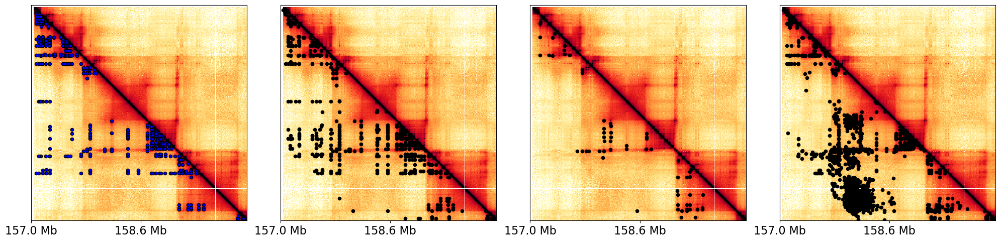

     chr1    anchor1    anchor2      prob
2    chr5  157072000  157142000  0.997102
3    chr5  157072000  157266000  0.998350
7    chr5  157072000  157462000  0.990919
31   chr5  157142000  157266000  0.998991
33   chr5  157149000  157253000  0.998777
..    ...        ...        ...       ...
717  chr5  159903000  160007000  0.999144
742  chr5  160009000  160119000  0.999852
744  chr5  160021000  160118000  0.996524
745  chr5  160022000  160114000  0.990458
749  chr5  160081000  160118000  0.992990

[138 rows x 4 columns]


/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


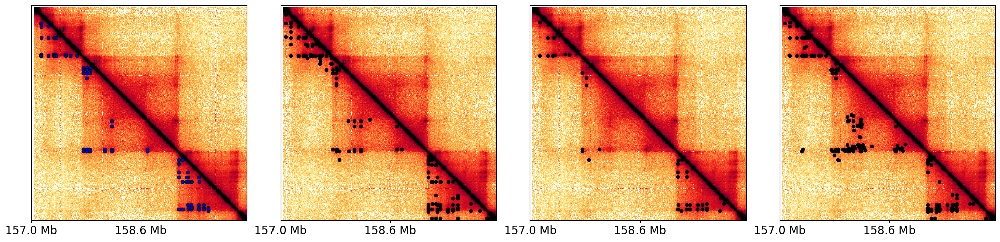

     chr1    anchor1    anchor2      prob
7    chr5  157143000  157266000  0.993691
12   chr5  157149000  157254000  0.995678
15   chr5  157143000  157731000  0.997599
16   chr5  157143000  157744000  0.998709
17   chr5  157143000  157857000  0.998201
..    ...        ...        ...       ...
478  chr5  160022000  160118000  0.998712
481  chr5  160048000  160080000  0.994494
483  chr5  160049000  160063000  0.997506
484  chr5  160065000  160079000  0.996488
485  chr5  160081000  160118000  0.999408

[68 rows x 4 columns]


/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


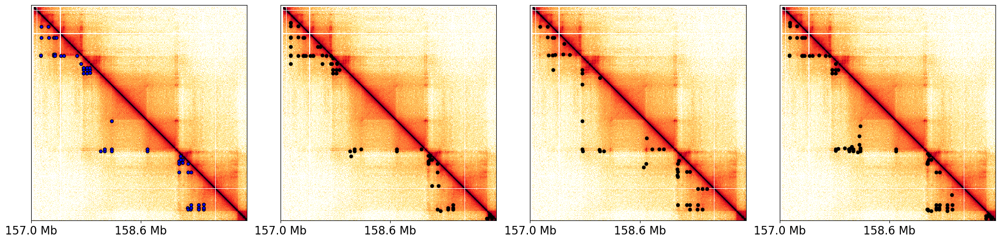

     chr1    anchor1    anchor2      prob
5    chr5  157149000  157253000  0.998098
6    chr5  157149000  157312000  0.999799
12   chr5  157148000  157471000  0.992754
13   chr5  157149000  157476000  0.996440
15   chr5  157149000  157743000  0.991552
..    ...        ...        ...       ...
766  chr4   62595000   62709000  0.999713
767  chr4   62595000   62644000  0.999771
779  chr4   63296000   63717000  0.999905
782  chr4   63529000   63716000  0.999378
783  chr4   63556000   63717000  0.999481

[114 rows x 4 columns]


/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


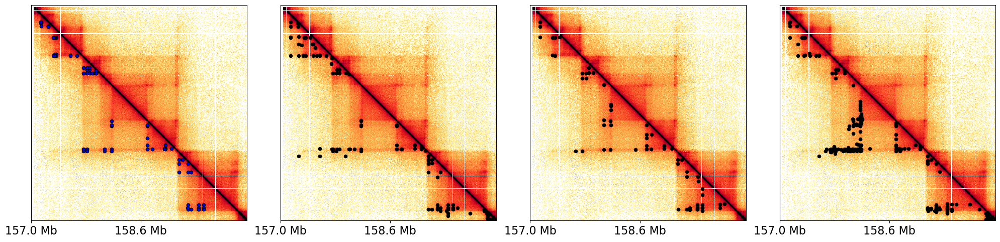

In [47]:
region_str = 'chr5:157000000-160150000'
# f"{savedir}{c}_{region_str}.svg"
for c in celltypes:
    res=2000
    matr = get_matr(clrs[c][1], region_str, oe=False)
    mustache[c] = mustache[c][mustache[c]['prob']<0.05]
    print(idli_heldout[c])
    fig = plot_loops_same_region([idli[c], idli_heldout[c][idli_heldout[c]['prob']>0.99], peakachu[c], mustache[c]], matr, 
                                 region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.05), figsize=(20,20), sd=None)

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


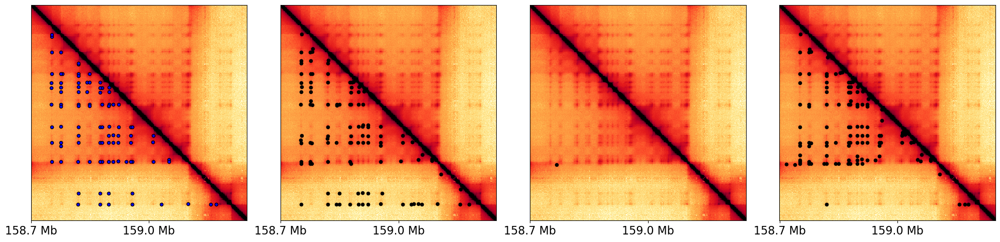

In [48]:
region_str = 'chr5:158700000-159250000'
c='GM12878'
res=1000
matr = get_matr(clrs[c][0], region_str, oe=False)
mustache[c] = mustache[c][mustache[c]['prob']<0.05]
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]],
                             matr, region_str, ['b', 'k', 'k', 'k'],res, 
                             vrange=(0.0001,0.1), figsize=(20,20),
                             sd=None)

/tmp/ipykernel_3546274/3601027725.py:84: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_3546274/3601027725.py:84: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


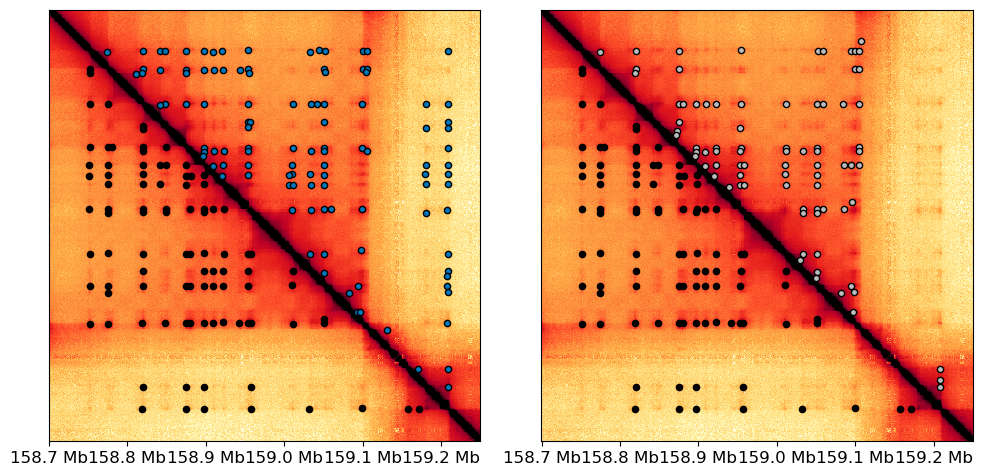

In [49]:
region_str = 'chr5:158700000-159250000'
c='GM12878'
res=1000
# f"{savedir}{c}_{region_str}_lw1.svg"
matr = get_matr(clrs[c][0], region_str, oe=False)
mustache[c] = mustache[c][mustache[c]['prob']<0.02]
fig = plot_loops_symm([idli[c], idli_heldout[c], mustache[c]],
                             matr, region_str, ['k', '#0077BB', '#BBBBBB'],res, 
                             vrange=(0.0001,0.1), figsize=(10,10),
                             sd=None)

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


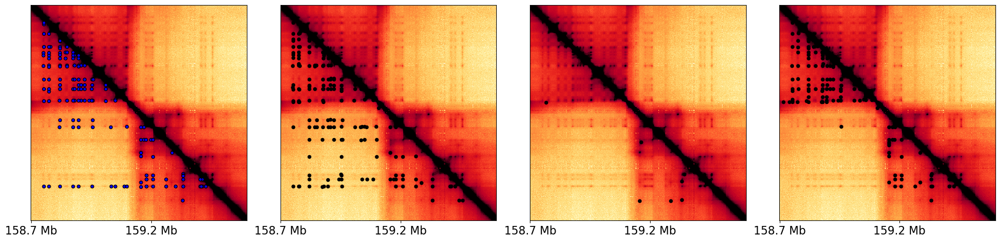

In [26]:
region_str = 'chr5:158700000-159600000'
c='GM12878'
res=2000
matr = get_matr(clrs[c][1], region_str, oe=False)
mustache[c] = mustache[c][mustache[c]['prob']<0.05]
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]],
                             matr, region_str, ['b', 'k', 'k', 'k'],res, 
                             vrange=(0.0001,0.05), figsize=(20,20),
                             sd = None)

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


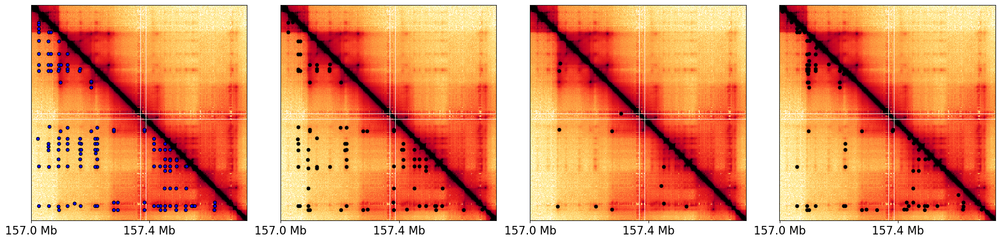

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


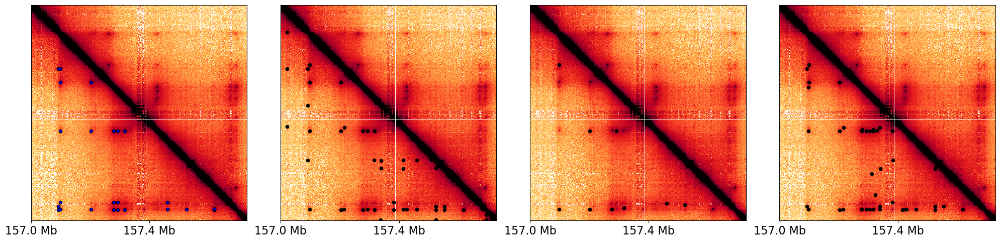

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


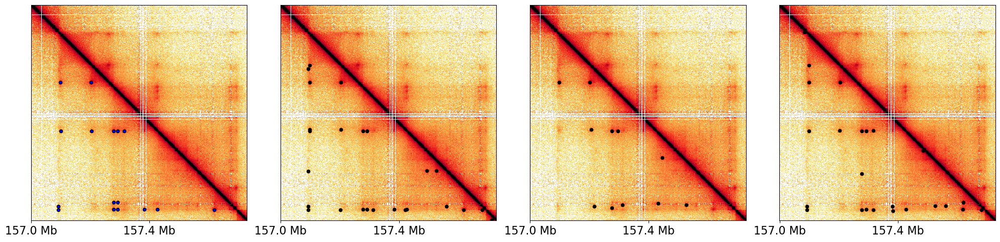

/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3546274/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')


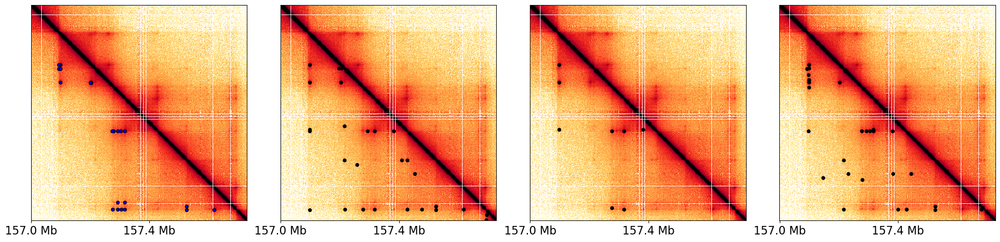

In [27]:
region_str = 'chr5:157050000-157780000'
for c in celltypes:
    res=1000
    matr = get_matr(clrs[c][0], region_str, oe=False)

    fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], matr, region_str,
                                 ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.05), figsize=(20,20),
                                  sd = None)
    

/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


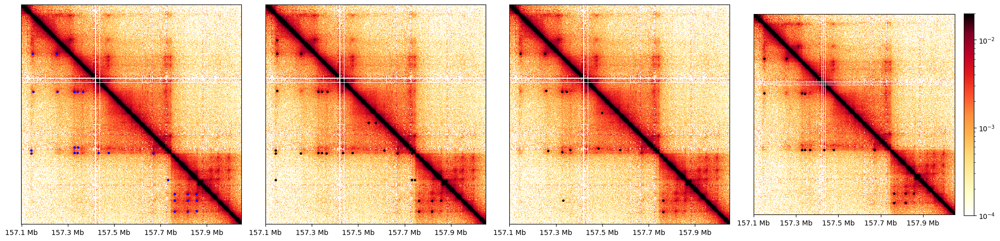

/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


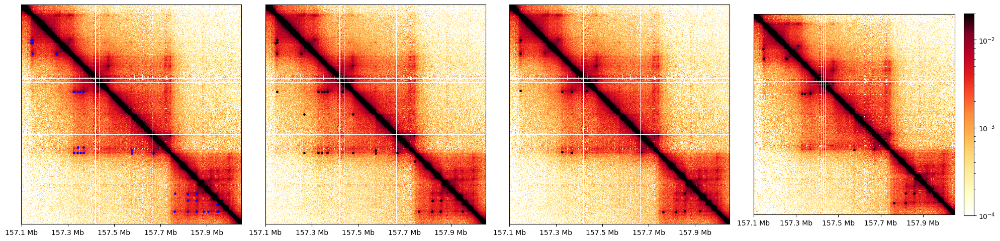

In [51]:
region_str = 'chr5:157100000-158050000'
for c in ['K562', 'H1']:
    res=1000
    matr = get_matr(clrs[c][0], region_str, oe=False)

    fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], matr, region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.02), figsize=(20,20))

/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


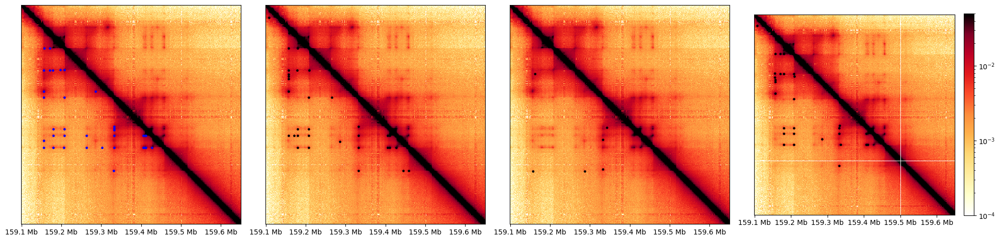

In [153]:
region_str = 'chr5:159100000-159650000'
c='GM12878'
res=1000
matr = get_matr(clrs[c][0], region_str, oe=False)
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], matr, region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.05), figsize=(20,20))

/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2999138305.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


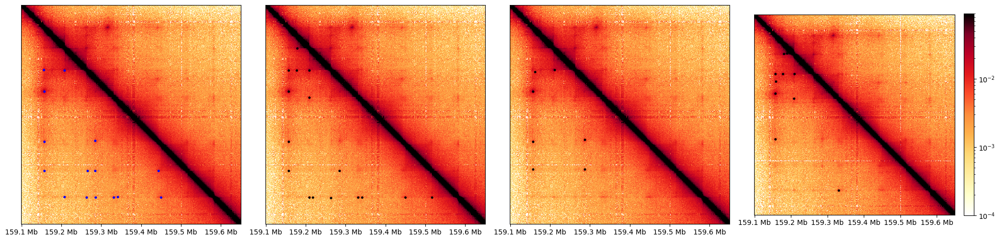

In [155]:
c='HCT116'
res=1000
hmatr = get_matr(clrs[c][0], region_str, oe=False)
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], hmatr, region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.09), figsize=(20,20))

/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


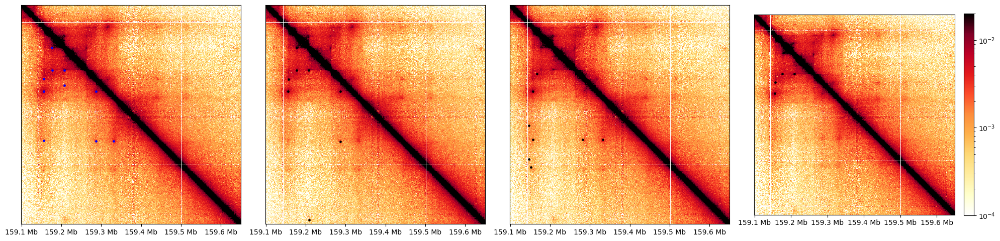

/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)
/tmp/ipykernel_1704954/2638574365.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels)


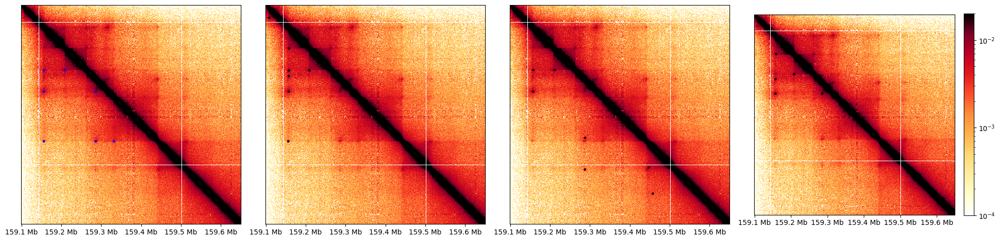

In [45]:
c='K562'
res=1000
hmatr = get_matr(clrs[c][0], region_str, oe=False)
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], hmatr, region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.02), figsize=(20,20))

c='H1'
res=1000
hmatr = get_matr(clrs[c][0], region_str, oe=False)
fig = plot_loops_same_region([idli[c], idli_heldout[c], peakachu[c], mustache[c]], hmatr, region_str, ['b', 'k', 'k', 'k'],res, vrange=(0.0001,0.02), figsize=(20,20))

/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_tick

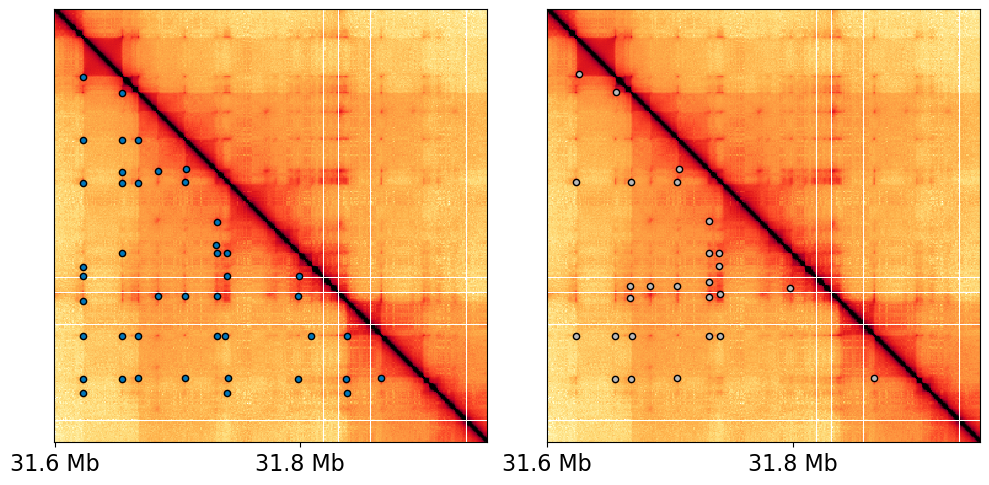

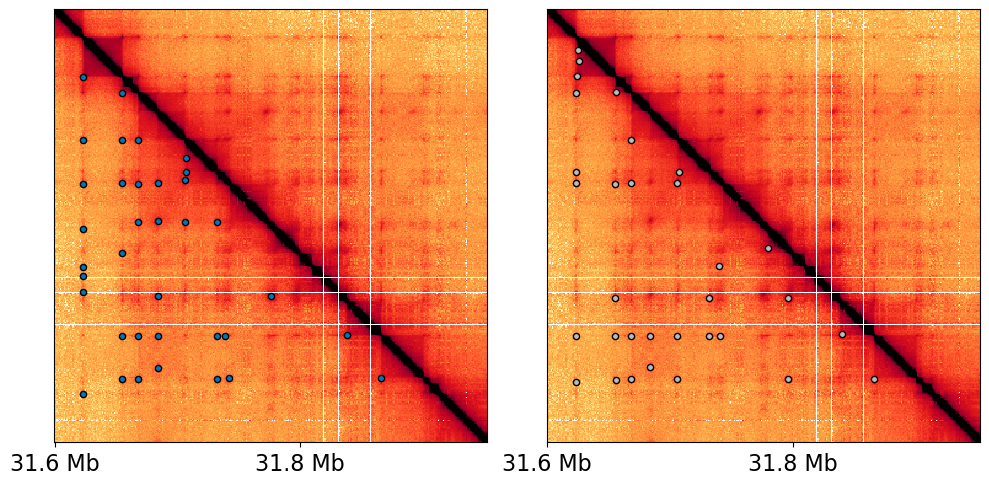

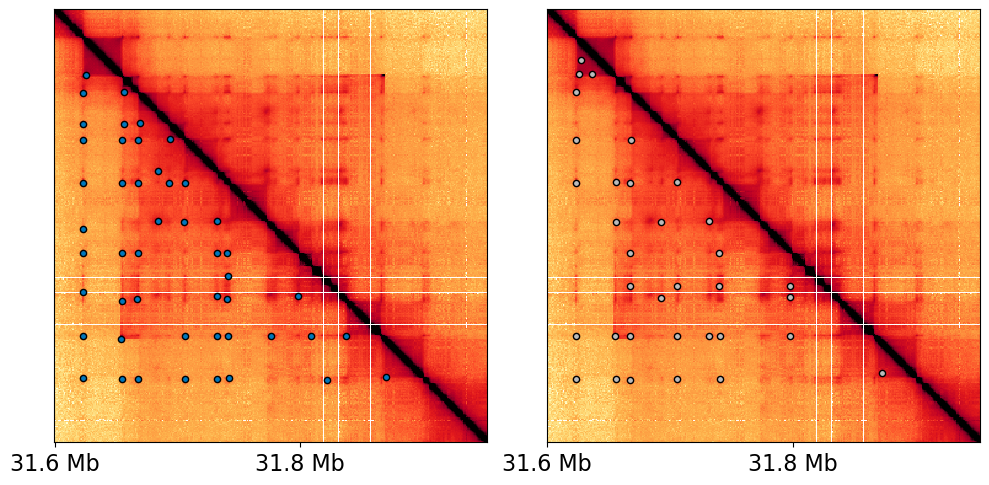

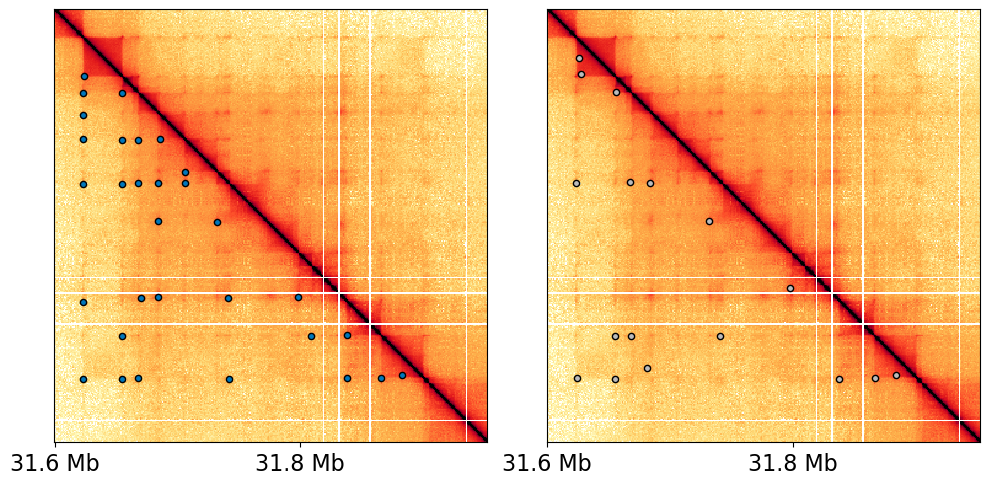

In [26]:
# predicted regions for IDLI only
region_str = 'chr6:31597000-31950000'
# f"{savedir}{c}_{region_str}.svg"
res=1000
for c in celltypes:
    matr = get_matr(clrs[c][0], region_str, oe=False)
    fig2 = plot_loops_same_region([idli[c], mustache_6[c]], matr, region_str, ['#0077BB', '#BBBBBB'],res, 
                                  vrange=(0.0001,0.35), figsize=(10,10), sd=f"{savedir}{c}_{region_str}.svg")
   

/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels(labels, ha='center')
/tmp/ipykernel_3380693/3601027725.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_tick

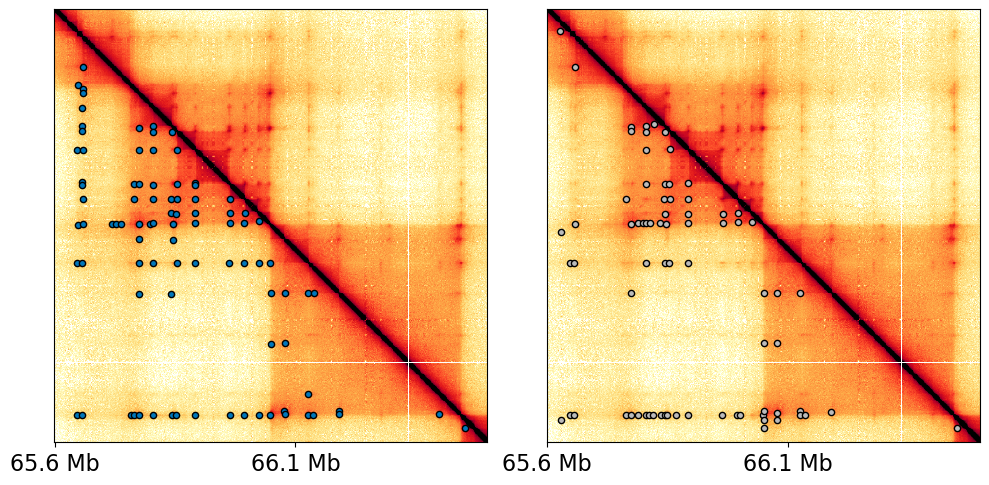

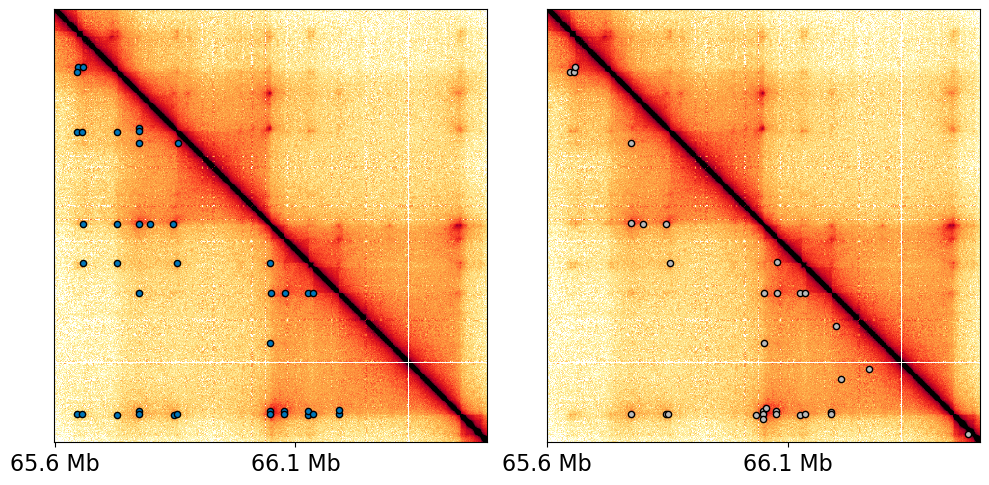

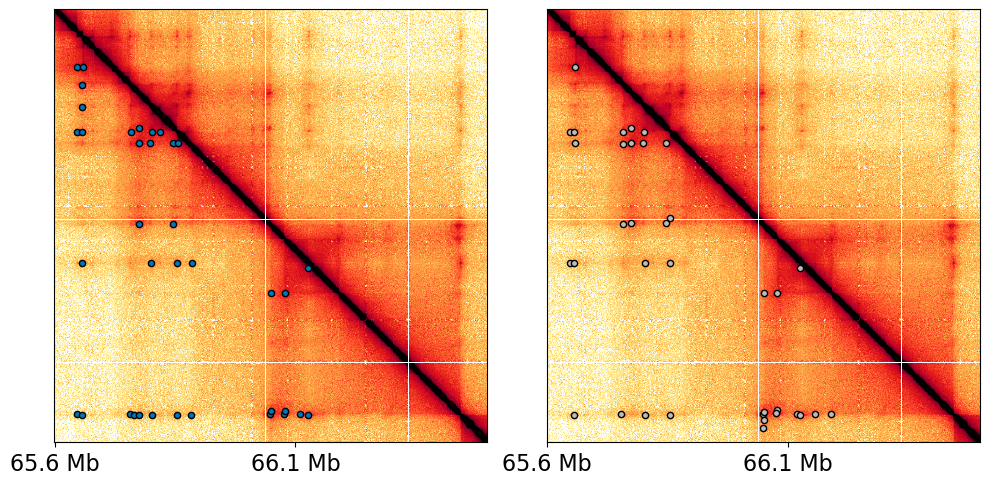

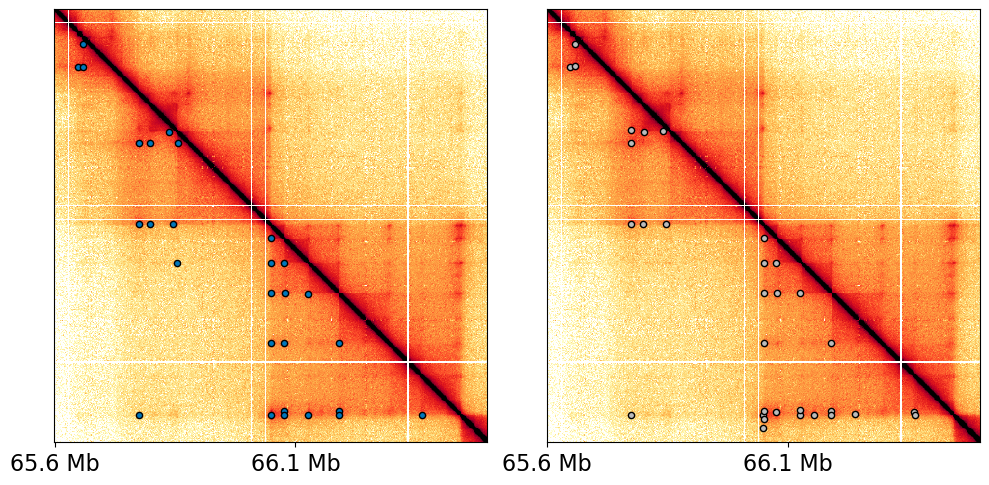

In [29]:
region_str = 'chr8:65587000-66485000'
res=2000
# f"{savedir}{c}_{region_str}.svg"
for c in celltypes:
    matr = get_matr(clrs[c][1], region_str, oe=False)
    #fig = plot_loops_single(idli[c], matr, region_str, 'b',res, vrange=(0.0001,0.008), figsize=(10,10))
    fig2 = plot_loops_same_region([idli[c], mustache_8[c]], matr, region_str, ['#0077BB', '#BBBBBB'],res, 
                                  vrange=(0.0001,0.05), figsize=(10,10), sd=f"{savedir}{c}_{region_str}.svg")


In [27]:
region_str =  'chr3:119024000-119824000'
res=2000
for c in celltypes:
    matr = get_matr(clrs[c][1], region_str, oe=False)
    #fig = plot_loops_single(idli[c], matr, region_str, 'b',res, vrange=(0.0001,0.04), figsize=(5,5))
    fig2 = plot_loops_same_region([idli[c], mustache_3[c]], matr, region_str, ['#0077BB', '#BBBBBB'],res, 
                                  vrange=(0.0001,0.08), figsize=(10,10), sd=f"{savedir}{c}_{region_str}.svg")


KeyError: 'GM12878'

In [28]:
region_str = 'chr9:108750000-109600000'
res=1000
for c in celltypes:
    matr = get_matr(clrs[c][0], region_str, oe=False)
    #fig = plot_loops_single(idli[c], matr, region_str, 'b',res, vrange=(0.0001,0.02), figsize=(10,10))
    fig2 = plot_loops_same_region([idli[c], mustache_9[c]], matr, region_str, ['b','k'],res, vrange=(0.0001,0.1), figsize=(10,10))

KeyError: 'GM12878'

### Representative insets - IDLI vs. Peakachu vs. Mustache

In [43]:
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.bottom'] = True

plt.rcParams['axes.linewidth'] = 0.25
plt.rcParams['xtick.major.width'] = 0.25
plt.rcParams['ytick.major.width'] = 0.25### PR curves for IDLI vs. Peakachu vs. Mustache 

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


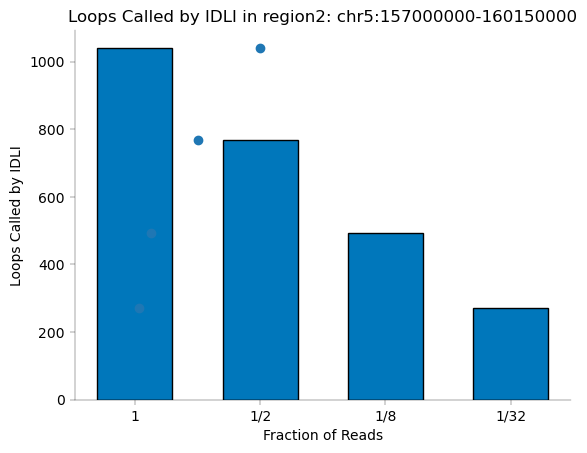

In [44]:


plt.bar(["1", "1/2", "1/8", "1/32"], [1041, 769, 492, 272], width=0.6, linewidth=1, 
        color='#0077BB', edgecolor='k')
plt.xlabel("Fraction of Reads")
plt.ylabel("Number of Called Loops")
plt.savefig(os.path.join(savedir, "supp_downsample_loopcalls.svg"))
#plt.show()

plt.scatter([1, 0.5, 0.125, 0.03125], [1041, 769, 492, 272])
plt.xlabel("Fraction of Reads")
plt.ylabel("Loops Called by IDLI")
plt.show()